In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!pip install patchify

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import os
from patchify import patchify  #Only to handle large images
import random
from scipy import ndimage

In [4]:
# Building Unet by dividing encoder and decoder into blocks

from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.optimizers import Adam
from keras.layers import Activation, MaxPool2D, Concatenate


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)   #Not in the original network.
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)

    return x

#Encoder block: Conv block followed by maxpooling


def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

#Build Unet using the blocks
def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024) #Bridge

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)  #Binary (can be multiclass)

    model = Model(inputs, outputs, name="U-Net")
    return model

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("swarajsolanke/mitochondria")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/mitochondria


In [6]:
from keras.utils import normalize
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify
import tifffile as tiff
from sklearn.preprocessing import MinMaxScaler
from keras.optimizers import Adam

In [34]:
random.seed(42)  # Set the seed
random_numbers = random.sample(range(0, 165), 64)
random_numbers

[163,
 28,
 6,
 70,
 62,
 57,
 35,
 26,
 139,
 22,
 151,
 108,
 8,
 7,
 23,
 55,
 59,
 129,
 162,
 143,
 50,
 156,
 107,
 56,
 114,
 71,
 1,
 40,
 153,
 87,
 145,
 39,
 149,
 86,
 157,
 150,
 97,
 24,
 45,
 136,
 44,
 77,
 33,
 103,
 5,
 93,
 58,
 68,
 15,
 48,
 10,
 161,
 37,
 106,
 80,
 79,
 46,
 73,
 127,
 90,
 152,
 120,
 84,
 29]

In [35]:
import tifffile as tiff

with tiff.TiffFile('/kaggle/input/mitochondria/training.tif') as tif_images, tiff.TiffFile('/kaggle/input/mitochondria/training_groundtruth.tif') as tif_masks:
    extracted_images = [tif_images.pages[i] for i in random_numbers]  # Extract first 12 images
    extracted_masks = [tif_masks.pages[i] for i in random_numbers]  # Extract corresponding masks

# Process or save the extracted images and masks as needed

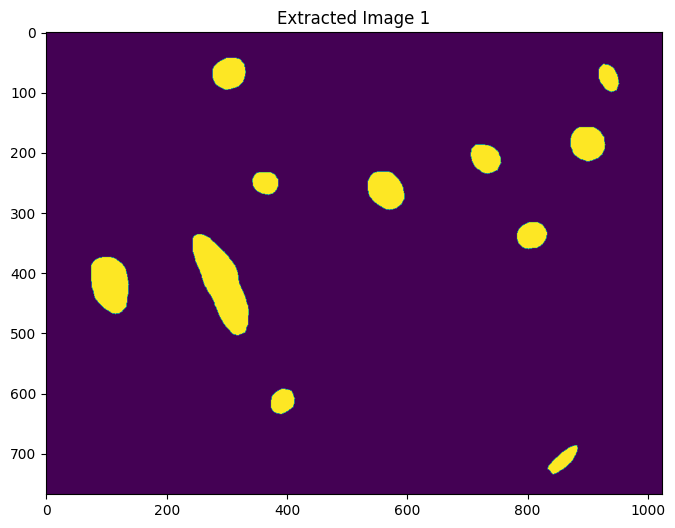

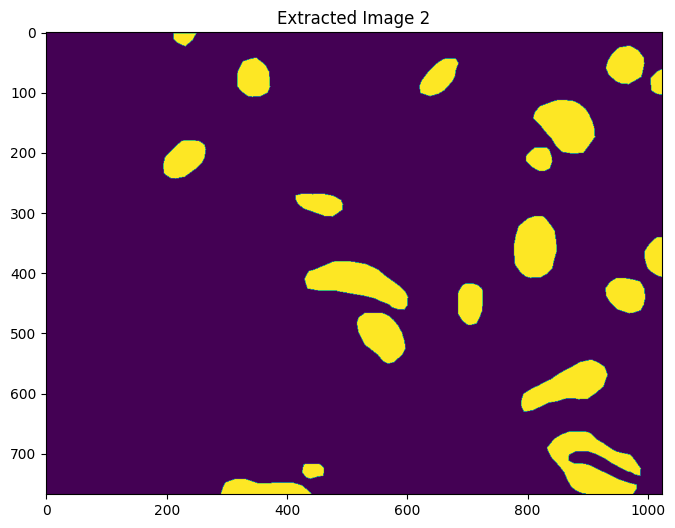

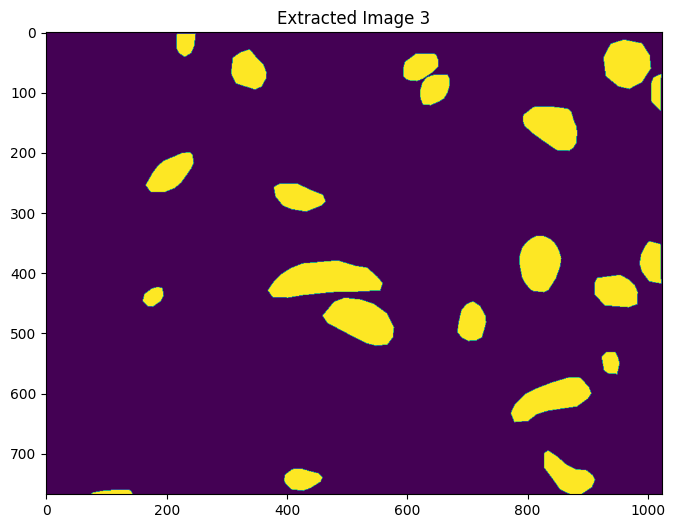

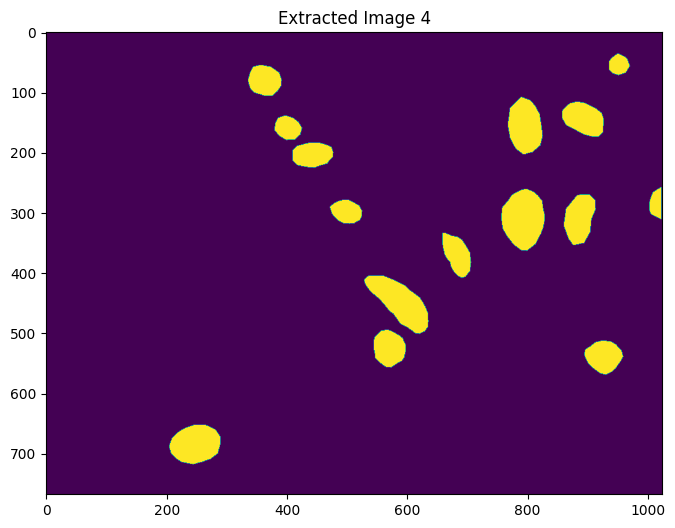

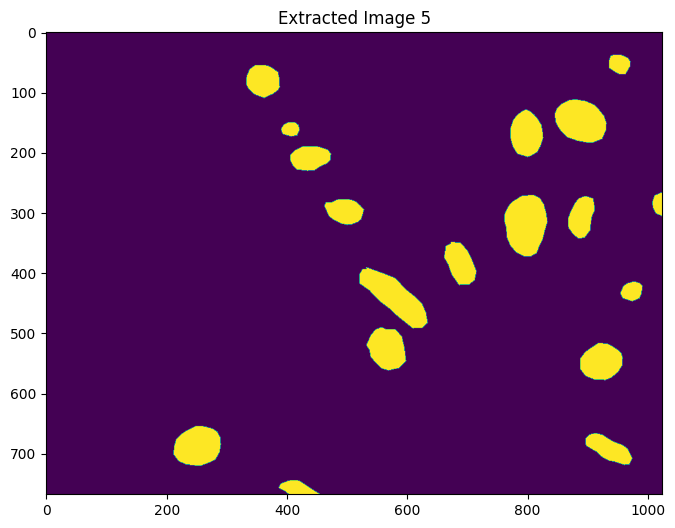

...

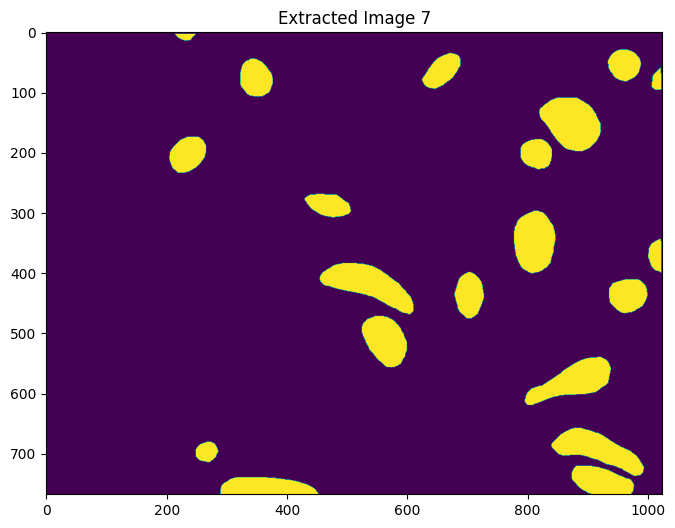

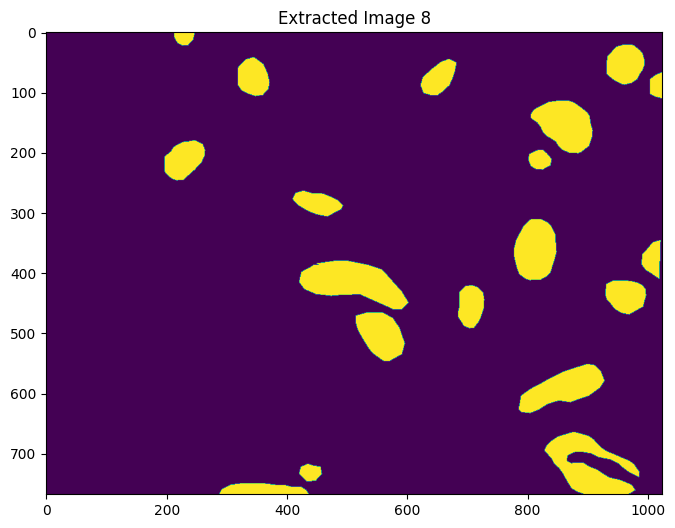

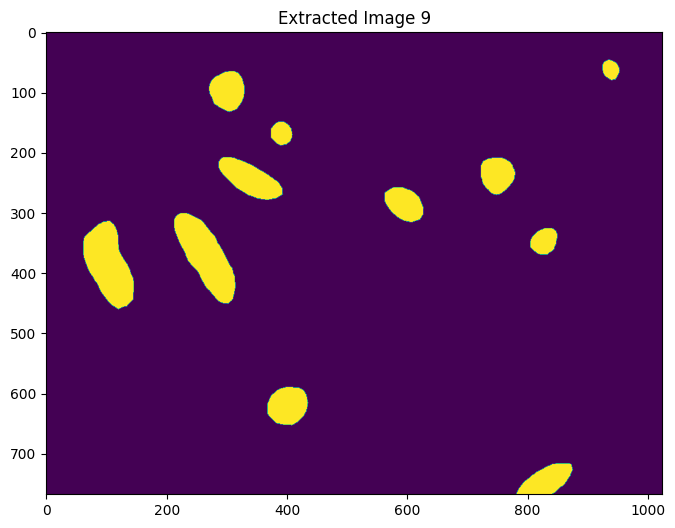

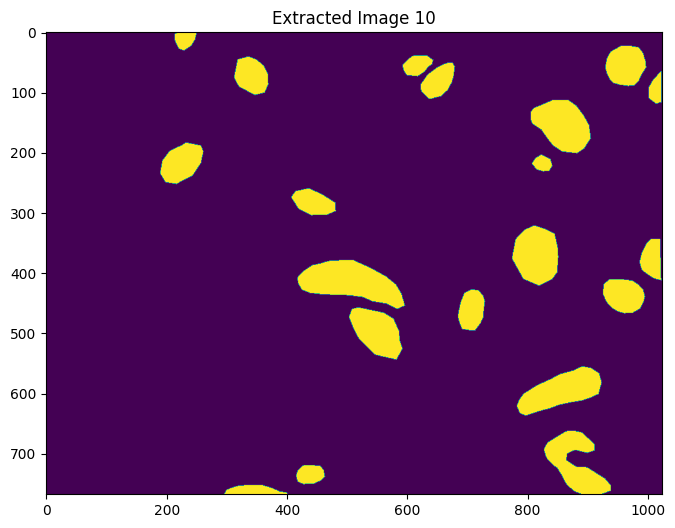

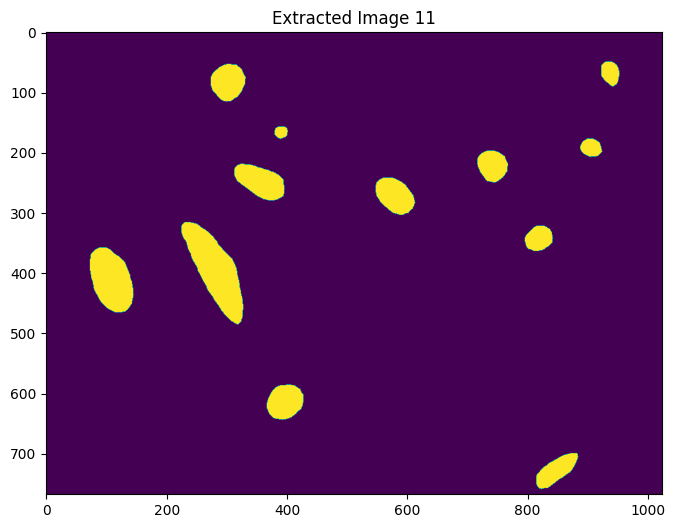

In [37]:
for i, image in enumerate(extracted_masks):
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    plt.imshow(image.asarray())  # Assuming grayscale images
    plt.title(f"Extracted Image {i + 1}")
    plt.show()
    if(i==10):
        break

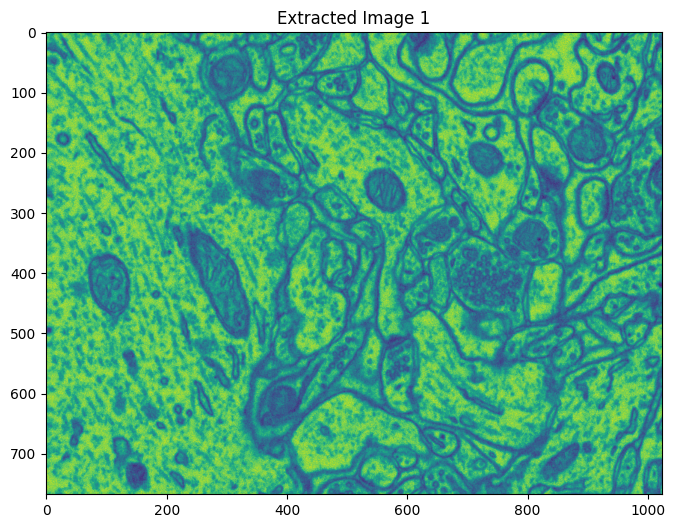

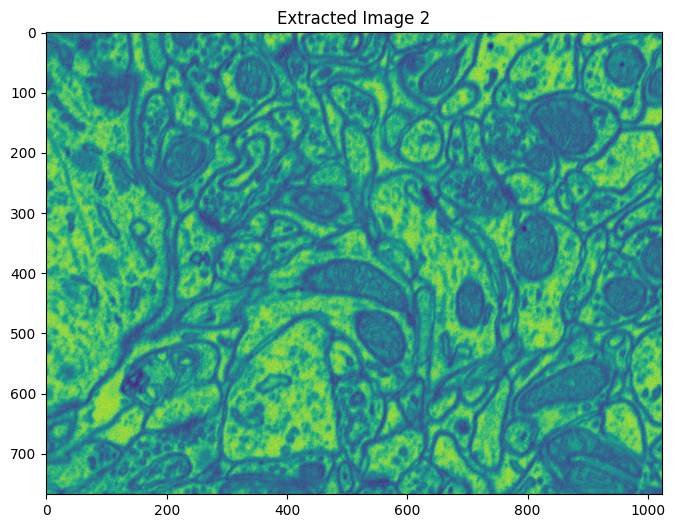

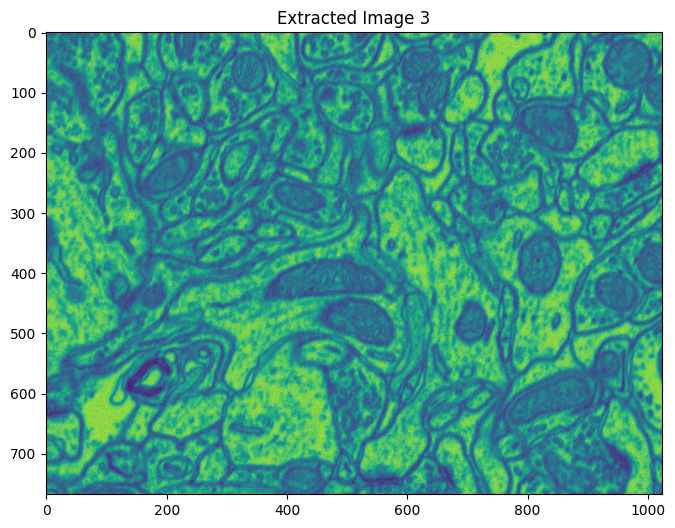

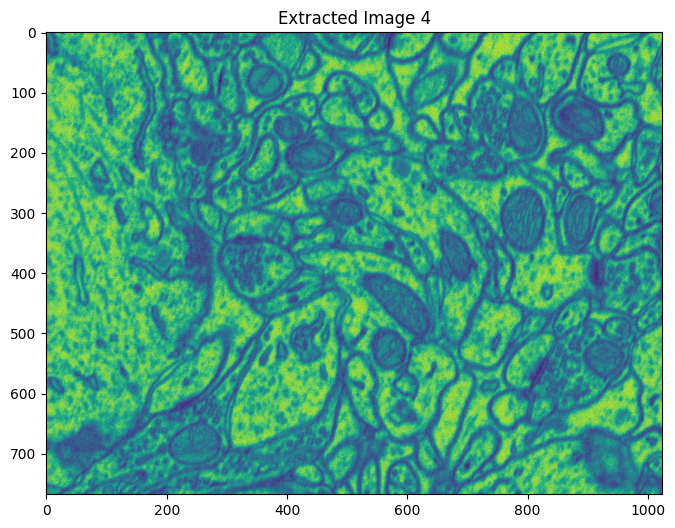

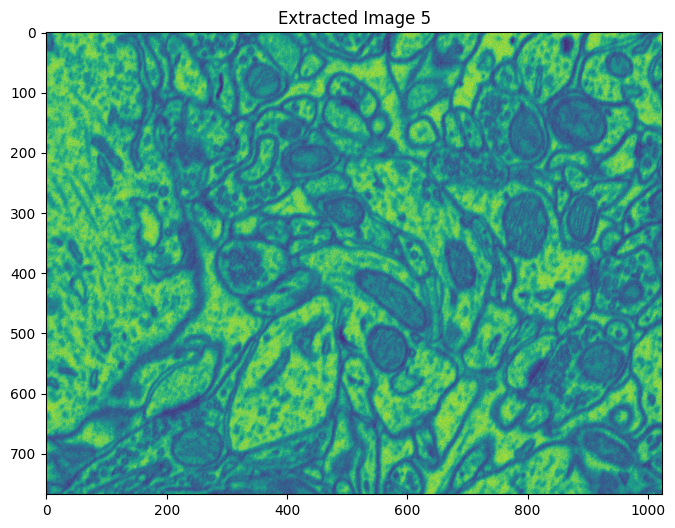

...

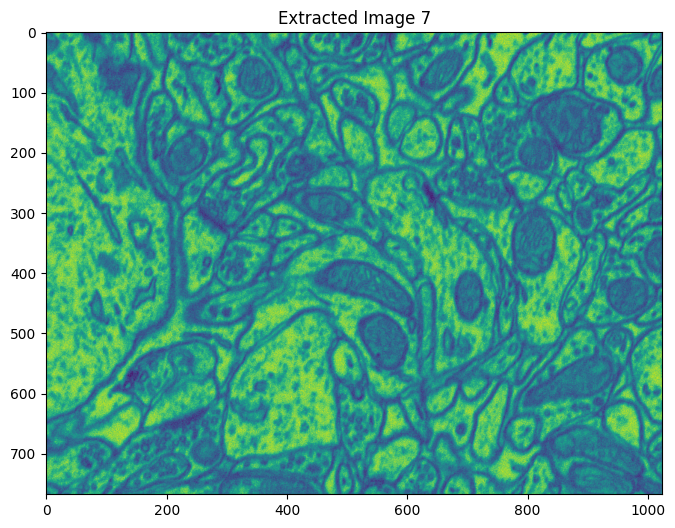

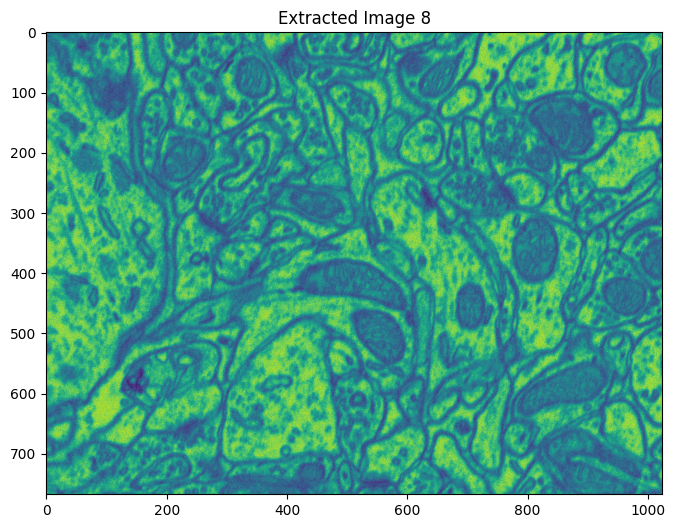

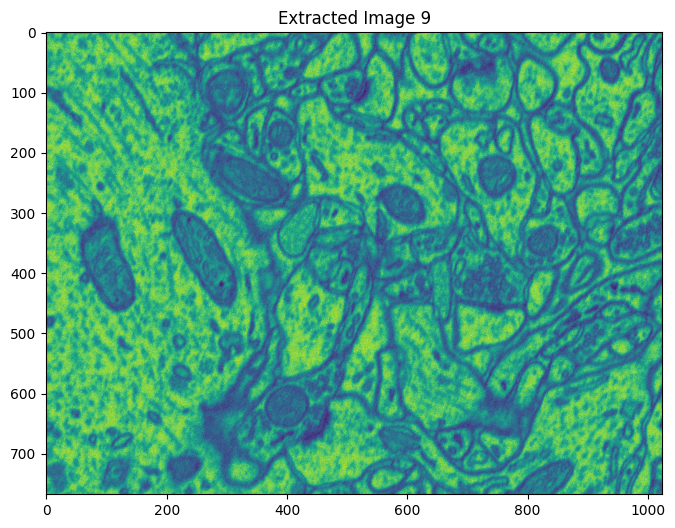

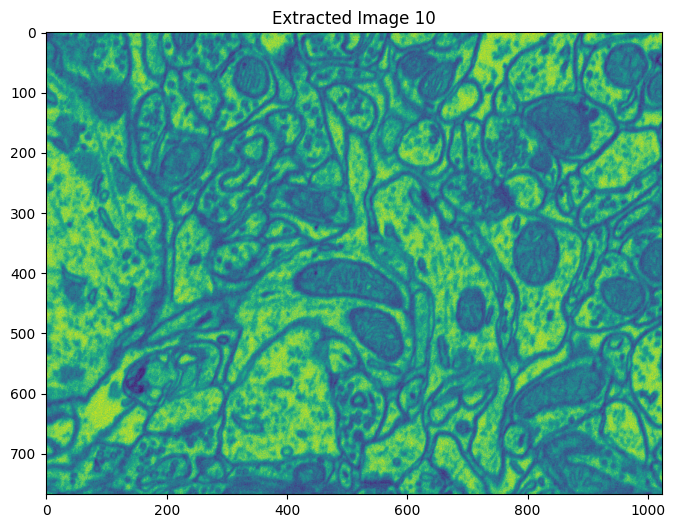

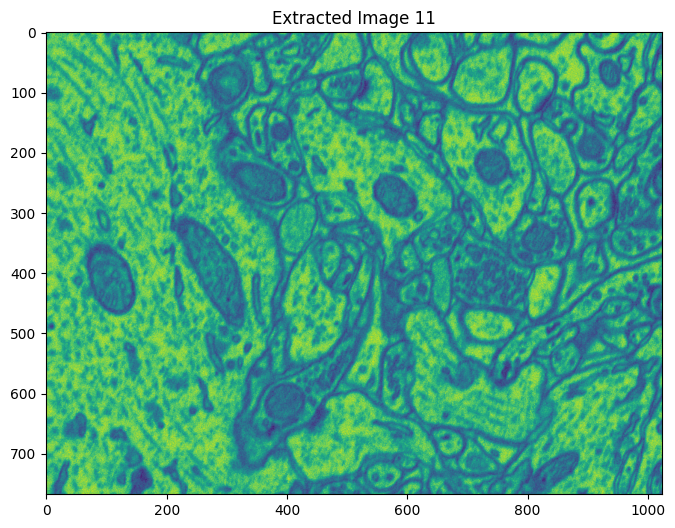

In [38]:
for i, image in enumerate(extracted_images):
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    plt.imshow(image.asarray())  # Assuming grayscale images
    plt.title(f"Extracted Image {i + 1}")
    plt.show()
    if(i==10):
        break

In [40]:
all_img_patches=[]
for img in range(len(extracted_images)):
  large_image=extracted_images[img].asarray()
  patches_img=patchify(large_image,(256,256),step=256)
  for i in range(patches_img.shape[0]):
    for j in range(patches_img.shape[1]):
      single_patch_img=patches_img[i,j,:,:]
      all_img_patches.append(single_patch_img.astype('float32')/255.)
images=np.array(all_img_patches)
images=np.expand_dims(images,axis=-1)
#

In [41]:
all_masks_patches=[]
for img in range(len(extracted_masks)):
  large_masks=extracted_masks[img].asarray()
  patches_masks=patchify(large_masks,(256,256),step=256)
  for i in range(patches_masks.shape[0]):
    for j in range(patches_masks.shape[1]):
      single_patch_mask=patches_masks[i,j,:,:]
      all_masks_patches.append(single_patch_mask/255.)
masks=np.array(all_masks_patches)
masks=np.expand_dims(masks,axis=-1)
#

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size = 0.20, random_state = 0)

In [43]:
X_train.shape

(614, 256, 256, 1)

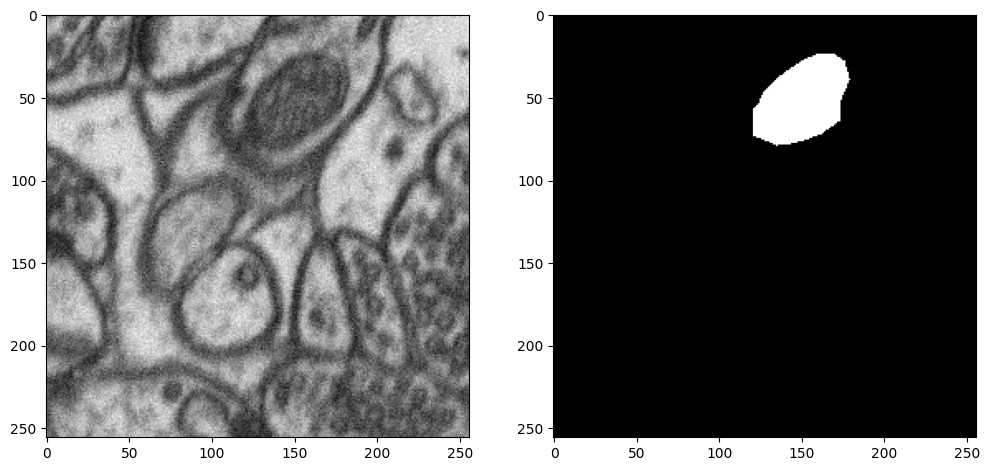

In [44]:
import random
import numpy as np
image_number = random.randint(0, len(X_train))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_train[image_number], (256, 256)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_train[image_number], (256, 256)), cmap='gray')
plt.show()

In [45]:
IMG_HEIGHT = images.shape[1]
IMG_WIDTH  = images.shape[2]
IMG_CHANNELS = images.shape[3]
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

In [46]:
model = build_unet(input_shape)
model.compile(optimizer=Adam(1e-3), loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)        │ (None, 256, 256, 64)   │            640 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_18    │ (None, 256, 256, 64)   │            256 │ conv2d_19[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ activation_18[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_19    │ (None, 256, 256, 64)   │            256 │ conv2d_20[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_19             │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 128, 128, 64)   │              0 │ activation_19[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 128, 128, 128)  │            512 │ conv2d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_20             │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ activation_20[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 128, 128, 128)  │            512 │ conv2d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_21             │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5      

 Total params: 31,054,145 (118.46 MB)

 Trainable params: 31,042,369 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [49]:
seed=24
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_data_gen_args = dict(rotation_range=90,
                     width_shift_range=0.3,
                     height_shift_range=0.3,
                     shear_range=0.5,
                     zoom_range=0.3,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect')

mask_data_gen_args = dict(rotation_range=90,
                     width_shift_range=0.3,
                     height_shift_range=0.3,
                     shear_range=0.5,
                     zoom_range=0.3,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect',
                     preprocessing_function = lambda x: np.where(x>0, 1, 0).astype(x.dtype)) #Binarize the output again.

image_data_generator = ImageDataGenerator(**img_data_gen_args)
#image_data_generator.fit(X_train, augment=True, seed=seed)

batch_size= 16

image_generator = image_data_generator.flow(X_train, seed=seed, batch_size=batch_size)
valid_img_generator = image_data_generator.flow(X_test, seed=seed, batch_size=batch_size) #Default batch size 32, if not specified here

mask_data_generator = ImageDataGenerator(**mask_data_gen_args)
#mask_data_generator.fit(y_train, augment=True, seed=seed)
mask_generator = mask_data_generator.flow(y_train, seed=seed, batch_size=batch_size)
valid_mask_generator = mask_data_generator.flow(y_test, seed=seed, batch_size=batch_size)  #Default batch size 32, if not specified here

def my_image_mask_generator(image_generator, mask_generator):
    train_generator = zip(image_generator, mask_generator)
    for (img, mask) in train_generator:
        yield (img, mask)

my_generator = my_image_mask_generator(image_generator, mask_generator)

validation_datagen = my_image_mask_generator(valid_img_generator, valid_mask_generator)

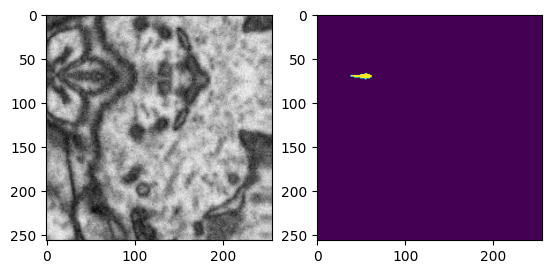

In [50]:
x = image_generator[0]
y = mask_generator[0]
for i in range(0,1):
    image = x[i]
    mask = y[i]
    plt.subplot(1,2,1)
    plt.imshow(image[:,:,0], cmap='gray')
    plt.subplot(1,2,2)
    plt.imshow(mask[:,:,0])
    plt.show()

In [51]:
steps_per_epoch = 3*(len(X_train))//batch_size


history = model.fit(my_generator, validation_data=validation_datagen,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=steps_per_epoch, epochs=64)

Epoch 1/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 129s 739ms/step - accuracy: 0.8754 - loss: 0.3076 - val_accuracy: 0.9326 - val_loss: 0.3855
Epoch 2/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 57s 494ms/step - accuracy: 0.9713 - loss: 0.0863 - val_accuracy: 0.3937 - val_loss: 6.5106
Epoch 3/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 56s 486ms/step - accuracy: 0.9683 - loss: 0.0977 - val_accuracy: 0.9338 - val_loss: 0.2690
Epoch 4/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 56s 485ms/step - accuracy: 0.9660 - loss: 0.1167 - val_accuracy: 0.9221 - val_loss: 0.2830
Epoch 5/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 55s 481ms/step - accuracy: 0.9447 - loss: 0.1876 - val_accuracy: 0.9352 - val_loss: 0.2403
Epoch 6/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 55s 480ms/step - accuracy: 0.9546 - loss: 0.1463 - val_accuracy: 0.9766 - val_loss: 0.0908
Epoch 7/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 55s 481ms/step - accuracy: 0.9638 - loss: 0.1167 - val_accuracy: 0.9766 - val_loss: 0.0937
Epoch 8/64
115/115 ━━━━━━━━━━━━━━━━━━━━ 55s 480ms/step - accuracy: 0.9627 - loss: 

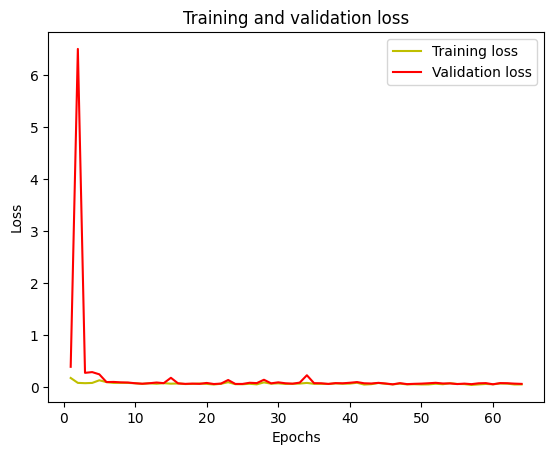

In [52]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

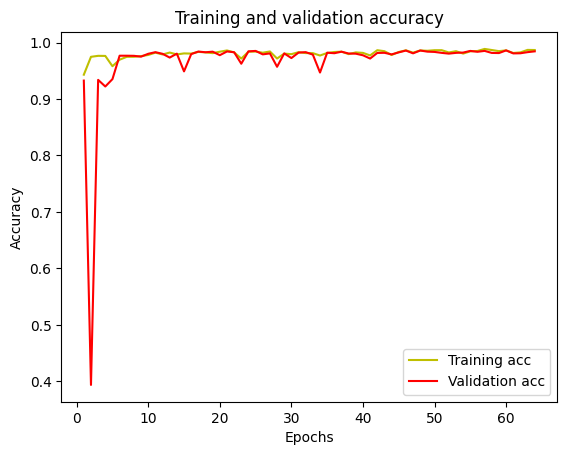

In [53]:
acc = history.history['accuracy']
#acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
#val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [54]:
#IOU
y_pred=model.predict(X_test)
y_pred_thresholded = y_pred > 0.5

intersection = np.logical_and(y_test, y_pred_thresholded)
union = np.logical_or(y_test, y_pred_thresholded)
iou_score = np.sum(intersection) / np.sum(union)
print("IoU socre is: ", iou_score)

5/5 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step 
IoU socre is:  0.859284095706224


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


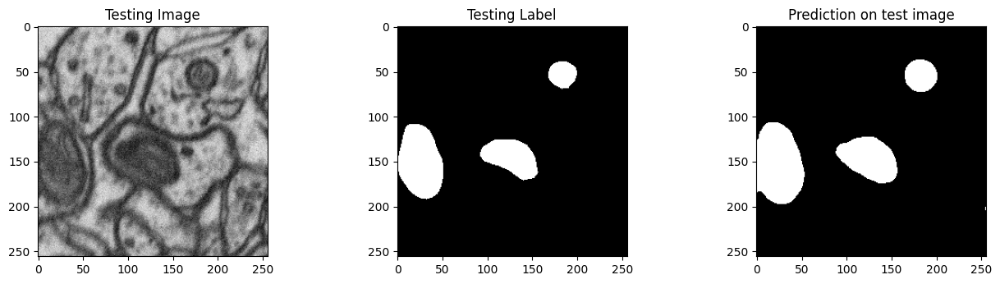

In [56]:
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input)[0,:,:,0] > 0.2).astype(np.uint8)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()